**Instituto Tecnológico de Costa Rica**

**Escuela de Ingeniería en Computación**

**Maestría Académica en Ciencias de la Computación**

**Curso: Electiva Deep Learning**

**Segundo Semestre 2024**

**Profesor: Dr. Luis-Alexander Calvo-Valverde**

---

**Trabajo Práctico:** 2

**Datos de la entrega:** Jueves 17 de octubre 2024, a más tardar a las 6:00 pm

**Medio de entrega**: Por medio del TEC-Digital.

**Entregables**: Un archivo comprimido con todos los archivos de su solución a este Trabajo Práctico. En caso de requerir mucho espacio, solicitarle al profesor una carpeta en One-Drive para subir la solución.

---

**Estudiantes:**
- Andrey Arguedas Espinoza - 2020426569

# Entregable 1.  Experimentación en Image Colorization

1. El objetivo central es investigar y experimentar en el uso de Deep Learning para la tarea de Image Colorization. En particular pasar de imágenes en escala de grises a imágenes a color.
1. Como dataset puede utilizar ImageWoof (https://docs.ultralytics.com/es/datasets/classify/imagewoof/#dataset-variants)  u otro de su elección. Sobre todo considerando la capacidad de procesamiento de que disponga.
1. Puede usar una biblioteca como OpenCV para obtener las imágenes en escala de grises, o incluso pasar las imágenes iniciales de RGB al espacio de color CIE LAB (el canal L le servirá).
1. Usted debe proponer e implementar el Diseño Experimental, el cual debe considerar al menos tres arquitecturas: dos existentes y una tercer arquitectura propuesta por Usted, no es problema que sea alguna de las dos primeras con algún cambio propuesto por Usted. Es requisito que se programen las capas requeridas para la red neuronal artificial, no usar frameworks que con la llamada a una función retornen el resultado.
1. Es válido utilizar código de alguna fuente como base, pero debe ser citada claramente la fuente.

## • Import required libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import tensorflow as tf
import tensorflow_datasets as tfds
import keras_tuner as kt
import seaborn as sns
import wandb
import cv2
import tensorflow_io as tfio
from collections import defaultdict

from PIL import Image
from tensorflow import keras
from tensorflow.keras import Sequential
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPooling2D, Dropout, BatchNormalization


### • Define global size for all our images, we will use this dimensions across our project, it also helps to reduce the resources needed to run the project and unifies the size of all images since in this dataset the images size is not unified

### • Define global batch size for the project, loading and training

In [2]:
images_dimensions = (120, 120)
reshapable_dimension = (120, 120, 1)
local_batch_size = 64
images_to_predict = 10
checkpoints_path = 'checkpoints_was_really_working_100_epochs/colorization_model.h5'
checkpoints_unet = 'checkpoints_unet_50_epochs/colorization_model.h5'
train_epochs_amount = 50

## • Load Dataset

In [3]:
print("Loading train dataset in progess....")

# Load the training dataset
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    './imagewoof2-160/train',
    batch_size=local_batch_size,  # Batch size
    image_size=images_dimensions,  # Resize images to the required input size for your model
)

print("Loading train dataset completed!!!")

print("Loading test dataset in progess....")

# Load the test dataset
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    './imagewoof2-160/val',
    batch_size=local_batch_size,  # Batch size
    image_size=images_dimensions,  # Resize images to the required input size for your model
)

print("Loading test dataset completed!!!")

Loading train dataset in progess....
Found 9025 files belonging to 10 classes.
Loading train dataset completed!!!
Loading test dataset in progess....
Found 3929 files belonging to 10 classes.
Loading test dataset completed!!!


## • Visualize a few images from training to see they are loading correctly

In [4]:
def visualize_images_lot(images, labels, lot_size = 16, rows = 4, cols= 4, figsize=(20, 20)):
    plt.figure(figsize=figsize)
    for i in range(lot_size): 
        ax = plt.subplot(rows, cols, i + 1)  # Create a rowsxcols grid for displaying images
        plt.imshow(images[i].numpy().astype("uint8"))  # Convert tensor to numpy and display
        plt.title(f"Label: {labels[i].numpy()}")  # Show the label    
    plt.show()  # Display the images

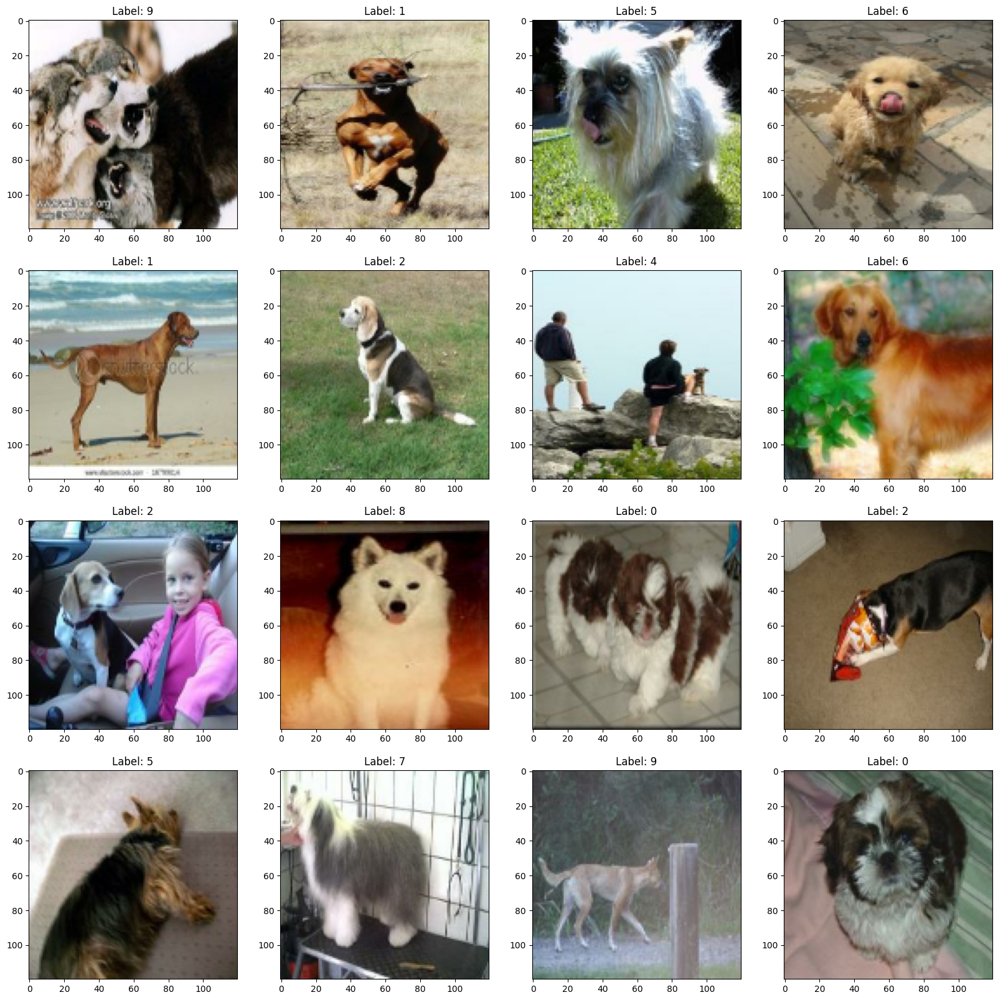

In [5]:
for first_images, first_labels in train_dataset.take(1):
    break
    
visualize_images_lot(first_images, first_labels)

## • Now we will convert our training dataset to the CIELAB color space

In [6]:
# Convert RGB image to Lab color space
def rgb_to_lab(image, label):
    normalized_image = image / 255.0
    lab_img = tfio.experimental.color.rgb_to_lab(normalized_image)
    return lab_img, label

In [7]:
# Apply the preprocessing function to the dataset
train_dataset = train_dataset.map(rgb_to_lab)

## • Now we can plot a few images of our training dataset to the CIELAB color space to see how each channel look

In [8]:
def visualize_images_lot_LAB(images, lot_size = 5, figsize=(10, 10)):
    for i in range(lot_size):
        fig, axs = plt.subplots(1, 3, figsize=(10, 10))
        image_lab = images[i]
    
        axs[0].imshow(image_lab[:, :, 0], cmap='gray')
        axs[0].set_title('L* (Lightness)')

        axs[1].imshow(image_lab[:, :, 1], cmap='RdYlGn')
        axs[1].set_title('a* (Red-Green)')

        axs[2].imshow(image_lab[:, :, 2], cmap='YlGnBu')
        axs[2].set_title('b* (Yellow-Blue)')
    
    plt.show()

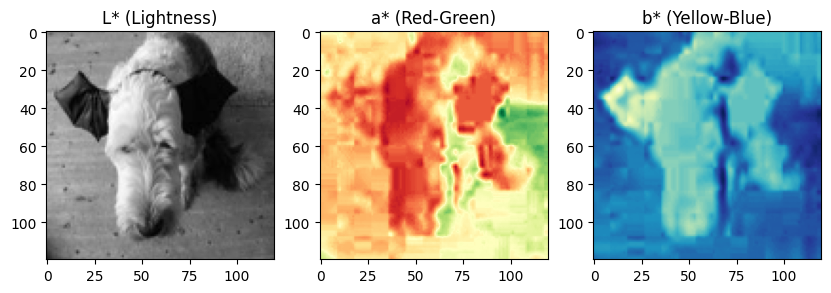

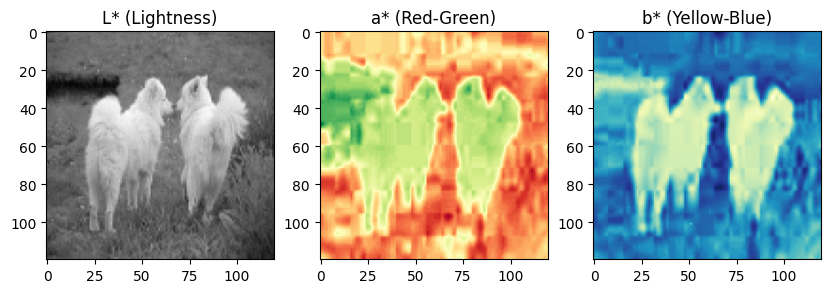

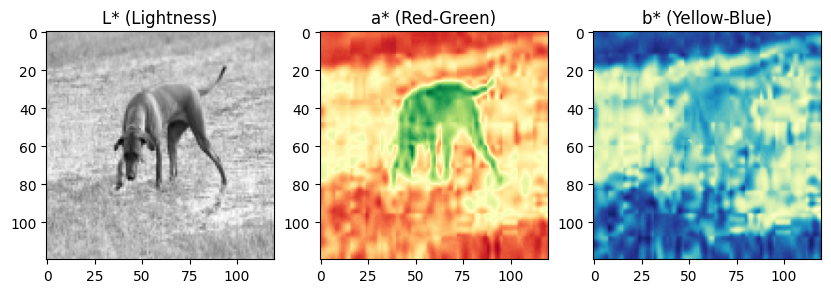

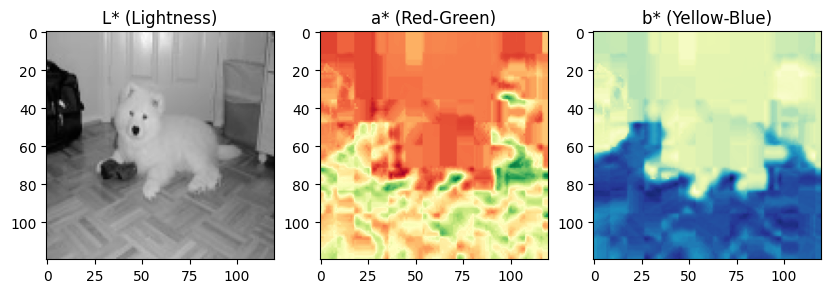

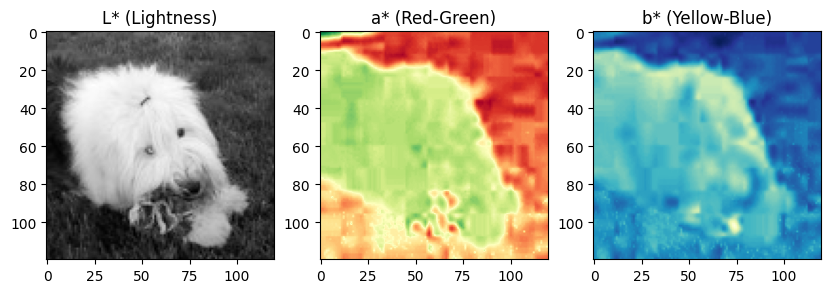

In [9]:
# Take the first batch from the dataset already converted to CIELAB
for images, labels in train_dataset.take(1):
    break  # You only need one batch

visualize_images_lot_LAB(images, 5)

### • In order to have a better handle of the dataset we first unbatch it and handle it as numpy array

In [10]:
train_dataset = train_dataset.unbatch()
train_images = np.asarray(list(train_dataset.map(lambda x, y: x)))

print("Shape of train images", train_images.shape)

Shape of train images (9025, 120, 120, 3)


## • Data normalization

### Note that the grayscale channel (L) normalizes different than the AB channels

In [11]:
#Images only with grayscale channel
X_grayscale_images = train_images[:, :, :, 0] / 255.0

#Images with AB channels
y_AB_channels = train_images[:, :, :, 1:] / 128.0

## • Show the normalized image to see they are still visible on the LAB channels but in a normalized way

In [12]:
def visualize_images_lot_LAB_Channels(L_channel, AB_channels, lot_size = 5, figsize=(10, 10)):
    for i in range(lot_size):
        fig, axs = plt.subplots(1, 3, figsize=figsize)
        l_channel = L_channel[i]
        ab_channels = AB_channels[i]
    
        axs[0].imshow(l_channel, cmap='gray')
        axs[0].set_title('L* (Lightness)')

        axs[1].imshow(ab_channels[:, :, 0], cmap='RdYlGn')
        axs[1].set_title('a* (Red-Green)')

        axs[2].imshow(ab_channels[:, :, 1], cmap='YlGnBu')
        axs[2].set_title('b* (Yellow-Blue)')
    
    plt.show()

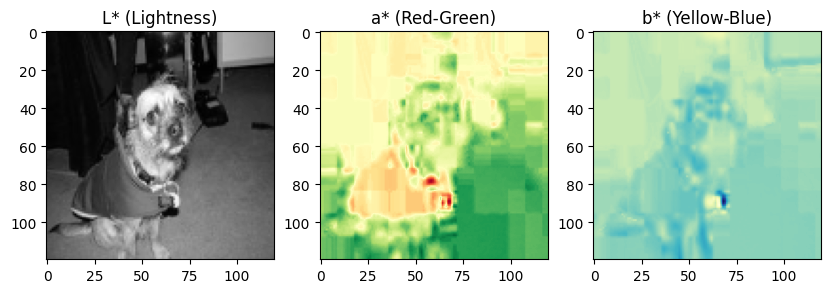

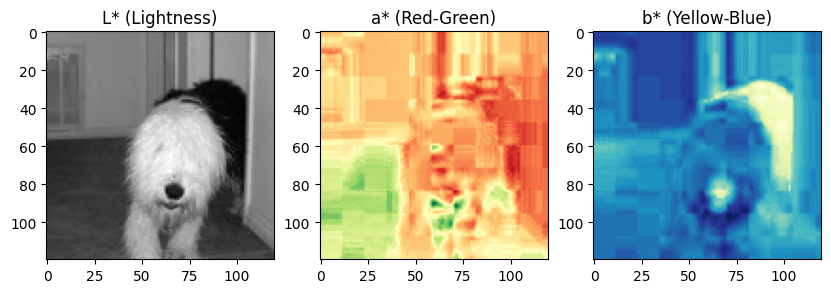

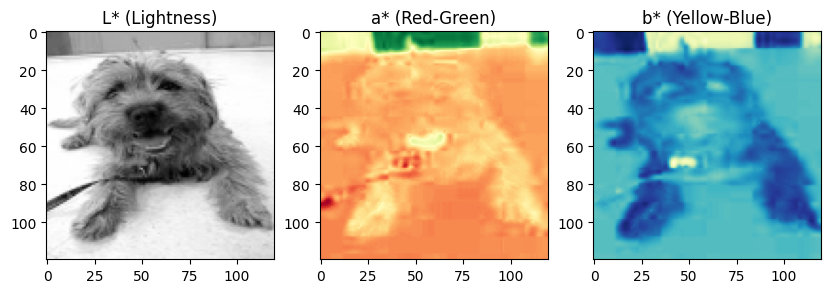

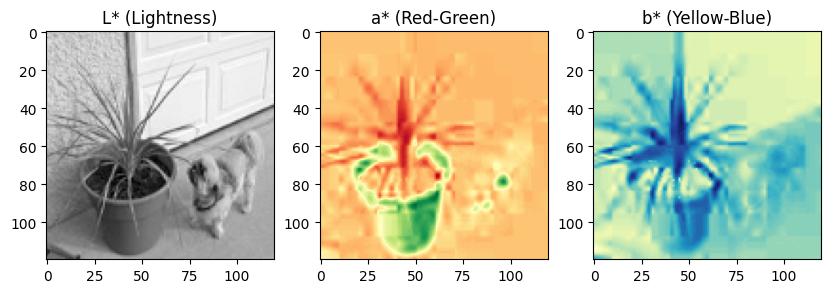

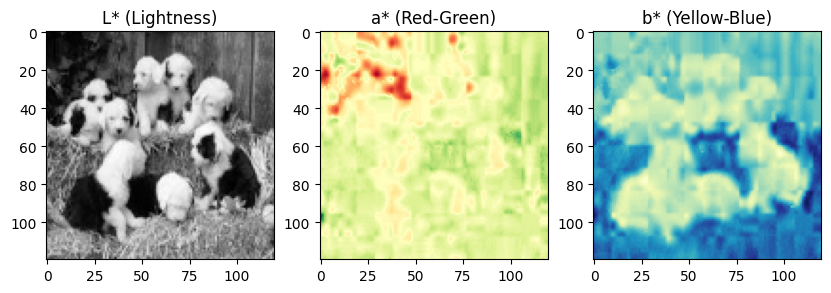

In [13]:
visualize_images_lot_LAB_Channels(X_grayscale_images,y_AB_channels, 5)

## Architecures 

### • Architecure # 1 Encoder - Decoder :First we implement a lightweigt Encoder -  Decoder version, the encoder treats the grayscale image while the decoder works trying to predict the AB channels. This Encoder - Decoder is a lightweight version, it will need more epochs to learn but the training will not require so much time per epoch.

In [14]:
# Define the model
def create_encoder_decoder_colorization_model(input_shape=reshapable_dimension):
    model = models.Sequential()

    # Encoder
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))
    
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))
    
    # Bottleneck
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())

    # Decoder
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.UpSampling2D((2, 2)))
    
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.UpSampling2D((2, 2)))
    
    model.add(layers.Conv2D(2, (3, 3), activation='tanh', padding='same'))  # Output 2 channels (AB)

    return model

In [15]:
# Training the model
def train_model(model, X_train, y_train, batch_size=64, epochs=50, checkpoint_dir=checkpoints_path):
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy', 'Precision'])

    # Create checkpoints folder
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    
    checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(checkpoint_dir, 'colorization_model.h5'),
        save_best_only=True,
        monitor='val_accuracy',
        mode='min'
    )
    
    # Train the model
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[checkpoint_cb])
    return history

### Show a summary of the Encoder-Decoder architecture

In [16]:
model = create_encoder_decoder_colorization_model(reshapable_dimension)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 120, 120, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 120, 120, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 60, 60, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 60, 60, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 60, 60, 64)       256       
 hNormalization)                                                 
                                                        

### Train the model, it is recomended to use 80-100 epochs

In [17]:
#history = train_model(model, X_grayscale_images, y_AB_channels, batch_size=local_batch_size, epochs=train_epochs_amount)

### • Visualize metrics from the training phase

In [18]:
def visualize_metrics(history, under_lim = -2, upper_lim = 2):
    pd.DataFrame(history.history).plot(figsize=(10, 7))
    plt.grid(True)
    plt.gca().set_ylim(under_lim, upper_lim)
    plt.xlabel("epochs")
    plt.show()

In [19]:
#visualize_metrics(history)

### • Architecture # 2 U-Net.

In [20]:
def create_unet_colorization_model(input_shape):
    inputs = layers.Input(shape=input_shape)
    
    # Contracting Path (Downsampling) with fewer filters and layers
    c1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.BatchNormalization()(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    
    c2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.BatchNormalization()(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.BatchNormalization()(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)
    
    # Bottleneck
    b = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p3)
    b = layers.BatchNormalization()(b)
    
    # Expanding Path (Upsampling) with fewer filters
    u3 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = layers.concatenate([u3, c3])
    c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u3)
    c4 = layers.BatchNormalization()(c4)

    u2 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = layers.concatenate([u2, c2])
    c5 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u2)
    c5 = layers.BatchNormalization()(c5)

    u1 = layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = layers.concatenate([u1, c1])
    c6 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u1)
    c6 = layers.BatchNormalization()(c6)
    
    # Output Layer (Predict a, b channels)
    outputs = layers.Conv2D(2, (1, 1), activation='tanh')(c6)
    
    # Define the model
    model = models.Model(inputs=[inputs], outputs=[outputs])
    
    return model

In [21]:
# Training the model
def train_model_unet(model, X_train, y_train, batch_size=64, epochs=50, checkpoint_dir=checkpoints_unet):
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy', 'Precision'])

    # Create checkpoints folder
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    
    checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(checkpoint_dir, 'colorization_model.h5'),
        save_best_only=True,
        monitor='val_accuracy',
        mode='min'
    )
    
    # Train the model
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[checkpoint_cb])
    return history

### • Load saved model

In [22]:
# Load the trained model
#model = tf.keras.models.load_model(checkpoints_path)

In [23]:
model = create_unet_colorization_model(reshapable_dimension)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 120, 120, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 120, 120, 32  320         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_5 (BatchNo  (None, 120, 120, 32  128        ['conv2d_6[0][0]']               
 rmalization)                   )                                                             

In [24]:
history = train_model_unet(model, X_grayscale_images, y_AB_channels, batch_size=local_batch_size, epochs=train_epochs_amount)

Epoch 1/50
113/113 [==============================] - 322s 3s/step - loss: 0.0288 - accuracy: 0.6971 - precision: 0.9959 - val_loss: 0.0117 - val_accuracy: 0.7833 - val_precision: 0.0000e+00
Epoch 2/50
113/113 [==============================] - 311s 3s/step - loss: 0.0100 - accuracy: 0.7454 - precision: 1.0000 - val_loss: 0.0108 - val_accuracy: 0.7831 - val_precision: 0.0000e+00
Epoch 3/50
113/113 [==============================] - 311s 3s/step - loss: 0.0095 - accuracy: 0.7544 - precision: 1.0000 - val_loss: 0.0106 - val_accuracy: 0.7847 - val_precision: 0.0000e+00
Epoch 4/50
113/113 [==============================] - 316s 3s/step - loss: 0.0093 - accuracy: 0.7581 - precision: 0.0000e+00 - val_loss: 0.0103 - val_accuracy: 0.7833 - val_precision: 0.0000e+00
Epoch 5/50
113/113 [==============================] - 316s 3s/step - loss: 0.0091 - accuracy: 0.7582 - precision: 0.0000e+00 - val_loss: 0.0101 - val_accuracy: 0.7834 - val_precision: 0.0000e+00
Epoch 6/50
113/113 [=================

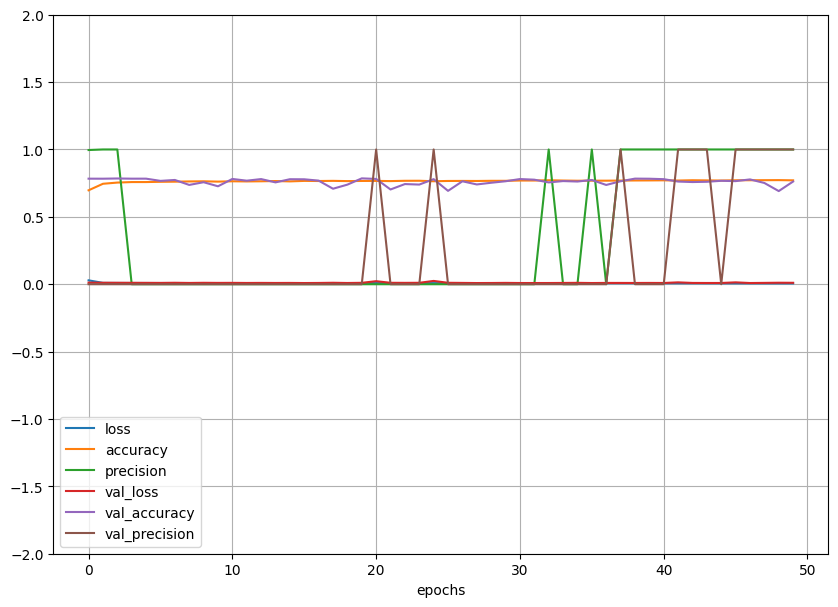

In [25]:
visualize_metrics(history)

### • Architecture #3

### Here we implement a GAN approach for colorization

### 1 -  Build the generator

In [26]:
def build_generator(input_shape = reshapable_dimension):
    model = models.Sequential()

    # Encoder
    model.add(layers.Conv2D(64, kernel_size=4, strides=2, padding='same', input_shape=input_shape))
    model.add(layers.ReLU())
    model.add(layers.Conv2D(128, kernel_size=4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Conv2D(256, kernel_size=4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    # Decoder
    model.add(layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Conv2DTranspose(2, kernel_size=4, strides=2, padding='same'))
    model.add(layers.Activation('tanh'))

    return model

### 2 -  Build the discriminator

In [27]:
def build_discriminator(input_shape = reshapable_dimension):
    model = models.Sequential()

    model.add(layers.Conv2D(64, kernel_size=4, strides=2, padding='same', input_shape=input_shape))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv2D(128, kernel_size=4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv2D(256, kernel_size=4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv2D(1, kernel_size=4, strides=2, padding='same'))
    model.add(layers.Activation('sigmoid'))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))

    return model

### 3 - Build the GAN

In [28]:
def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = models.Sequential()
    model.add(generator)
    model.add(discriminator)
    return model

In [29]:
def compile_models(generator, discriminator, gan):
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizers.Adam(0.0002, 0.5),metrics=['accuracy', 'Precision'])
    gan.compile(loss='binary_crossentropy', optimizer=optimizers.Adam(0.0002, 0.5))

### 4 - Train the GAN

In [30]:
def train_gan(generator, discriminator, gan, epochs, batch_size, train_data, grayscale_images):
    half_batch = batch_size // 2
    
    for epoch in range(epochs):
        for i, imgs in enumerate(train_data):
            # Get real images (grayscale and color)
            real_imgs = train_data[:half_batch]
            real_gray_imgs = grayscale_images[:half_batch]

            # Train the discriminator with real images
            valid = np.ones((half_batch, 1))
            fake = np.zeros((half_batch, 1))
            d_loss_real = discriminator.train_on_batch(real_imgs, valid)

            # Generate fake images (colorized by generator)
            fake_imgs = generator.predict(real_gray_imgs)
            combined_fake_imgs = np.concatenate([real_gray_imgs, fake_imgs], axis=-1)

            # Train the discriminator with fake images
            d_loss_fake = discriminator.train_on_batch(combined_fake_imgs, fake)

            # Train the generator
            valid = np.ones((batch_size, 1))
            g_loss = gan.train_on_batch(real_gray_imgs, valid)

            if i % 100 == 0:
                print(f'Epoch: {epoch+1}/{epochs}, Step: {i}, D Loss: {0.5 * np.add(d_loss_real, d_loss_fake)}, G Loss: {g_loss}')
        
        if epoch % 2 == 0:
            save_images(generator, epoch)


### Save images

In [31]:
def save_images(generator, epoch):
    r, c = 2, 5
    noise = np.random.normal(0, 1, (r * c, 120, 120, 1))
    gen_imgs = generator.predict(noise)
    
    fig, axs = plt.subplots(r, c)
    count = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[count] * 0.5 + 0.5)
            axs[i,j].axis('off')
            count += 1
    plt.show()

### Run GAN

In [32]:
# Initialize models
generator = build_generator()
generator.summary()
discriminator = build_discriminator()
discriminator.summary()
#gan = build_gan(generator, discriminator)

# Compile models
#compile_models(generator, discriminator, gan)

# Train GAN
#train_gan(generator, discriminator, gan, 10, 64, train_images, X_grayscale_images)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 60, 60, 64)        1088      
                                                                 
 re_lu (ReLU)                (None, 60, 60, 64)        0         
                                                                 
 conv2d_15 (Conv2D)          (None, 30, 30, 128)       131200    
                                                                 
 batch_normalization_12 (Bat  (None, 30, 30, 128)      512       
 chNormalization)                                                
                                                                 
 re_lu_1 (ReLU)              (None, 30, 30, 128)       0         
                                                                 
 conv2d_16 (Conv2D)          (None, 15, 15, 256)       524544    
                                                      

ValueError: Exception encountered when calling layer "sequential_2" (type Sequential).

Input 0 of layer "conv2d_17" is incompatible with the layer: expected axis -1 of input shape to have value 1, but received input with shape (None, 120, 120, 2)

Call arguments received by layer "sequential_2" (type Sequential):
  • inputs=tf.Tensor(shape=(None, 120, 120, 2), dtype=float32)
  • training=False
  • mask=None

## * Test phase

### • Now we also map the the test data to LAB format since we will need to generate grayscale of these images and then replace its AB channels with the predicted ones

In [33]:
test_dataset = test_dataset.map(rgb_to_lab)

In [34]:
test_dataset_lab = test_dataset.unbatch()
test_dataset_lab_images = np.asarray(list(test_dataset_lab.map(lambda x, y: x)))

print("Shape of val LAB images: ", test_dataset_lab_images.shape)

Shape of val LAB images:  (3929, 120, 120, 3)


In [35]:
#Images only with grayscale channel
test_images_grayscale = test_dataset_lab_images[:, :, :, 0] / 255.0
test_images_AB_channels = test_dataset_lab_images[:, :, :, 1:]

print("Shape of grayscale images: ", test_images_grayscale.shape)
print("Shape of AB channels: ", test_images_AB_channels.shape)

Shape of grayscale images:  (3929, 120, 120)
Shape of AB channels:  (3929, 120, 120, 2)


### • Now we can start predcting from grayscale channels to AB channels

In [36]:
def predict_AB_channels(grayscale_image, model):
    reshape_gray_image = grayscale_image.reshape(1 , grayscale_image.shape[0], grayscale_image.shape[1], 1)
    ab_channels = model.predict(reshape_gray_image)
    denormalized_ab_channels = ab_channels[0] * 128.0
    return denormalized_ab_channels

In [37]:
def lot_predictions(grayscale_images, model, lot_size = 5):
    predictions_lot = []
    for i in range(lot_size):
        predictions_lot.append(predict_AB_channels(grayscale_images[i], model))
    return predictions_lot

### We predict the first 5 images of our test data, to se how is predicting

In [38]:
first_test_predictions = lot_predictions(test_images_grayscale, model, images_to_predict)

1/1 [==============================] - 0s 30ms/step


### • Now let's plot our predictions

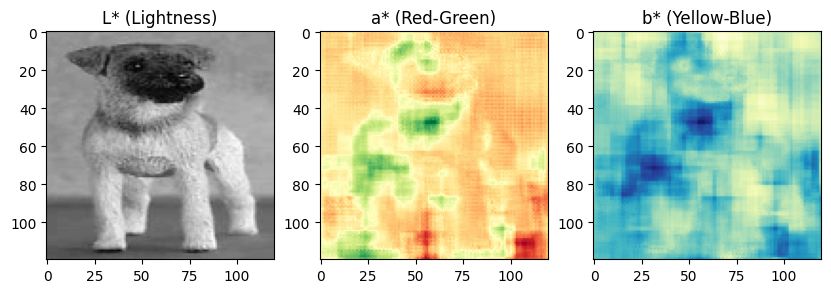

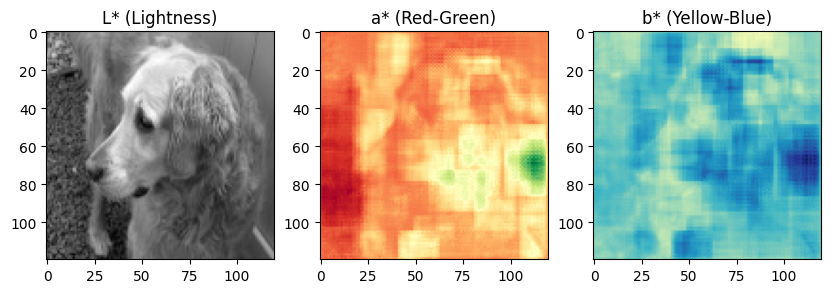

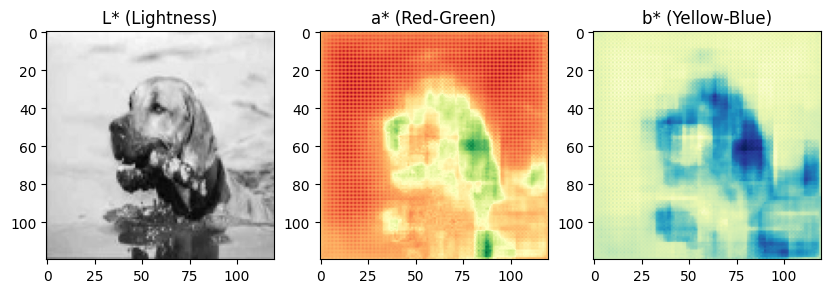

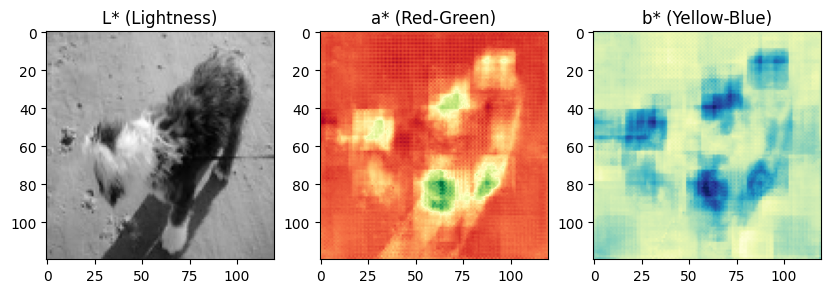

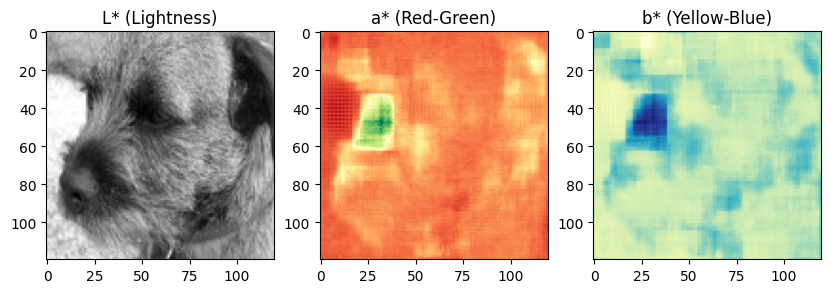

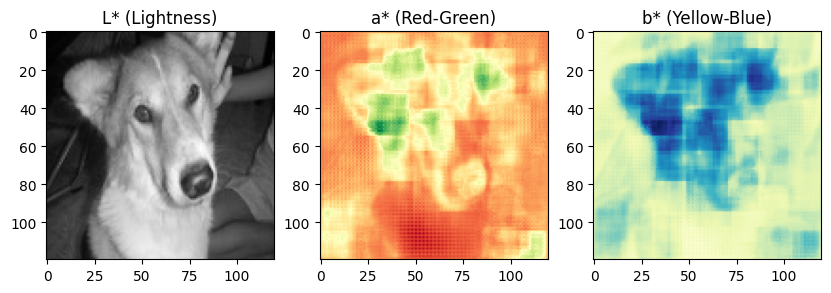

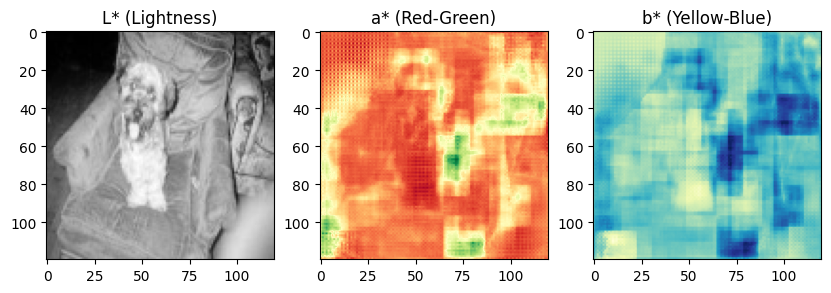

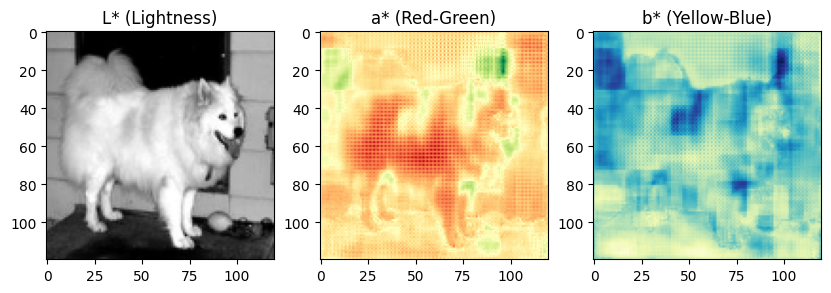

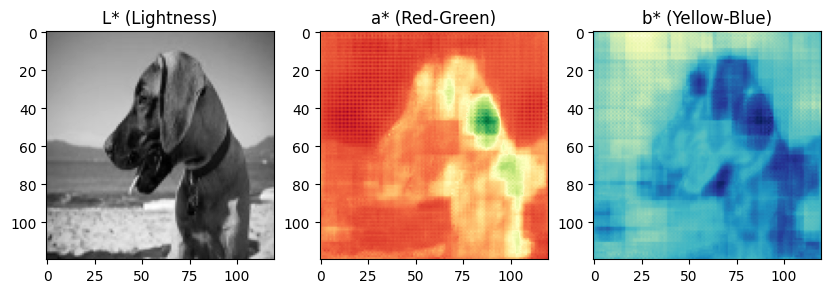

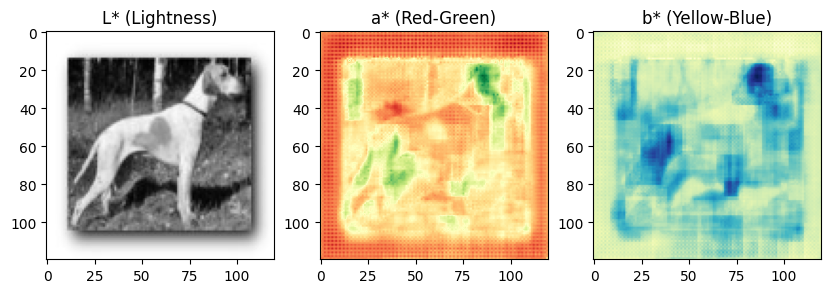

In [39]:
visualize_images_lot_LAB_Channels(test_images_grayscale, first_test_predictions, images_to_predict)

### • Now let's plot what it was expected in terms of channels

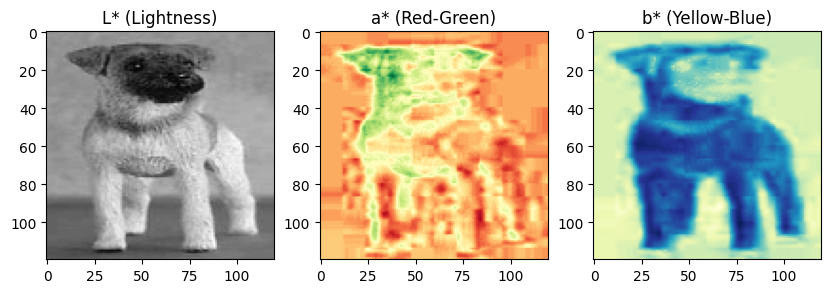

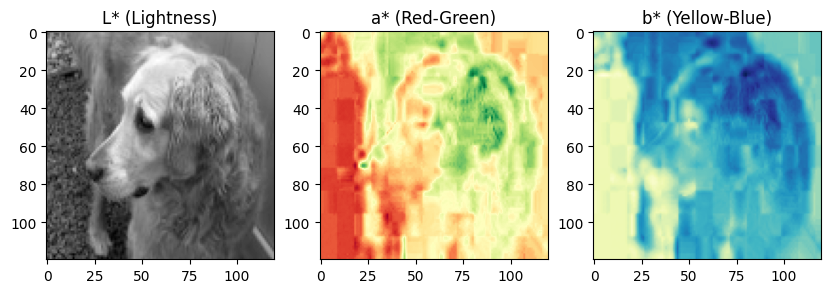

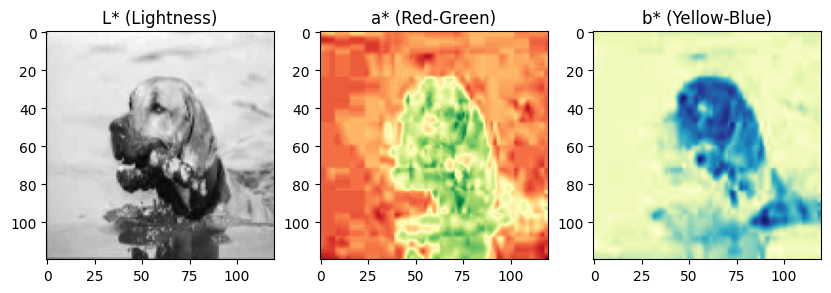

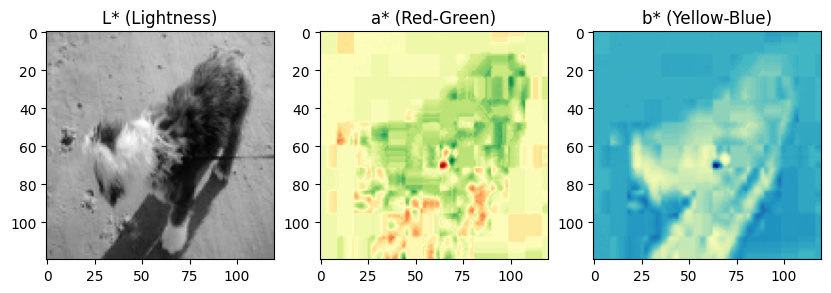

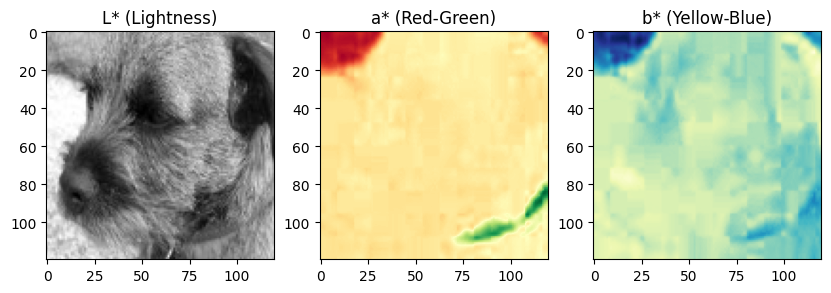

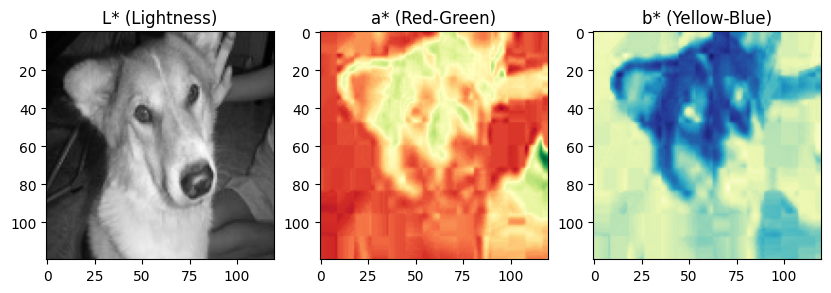

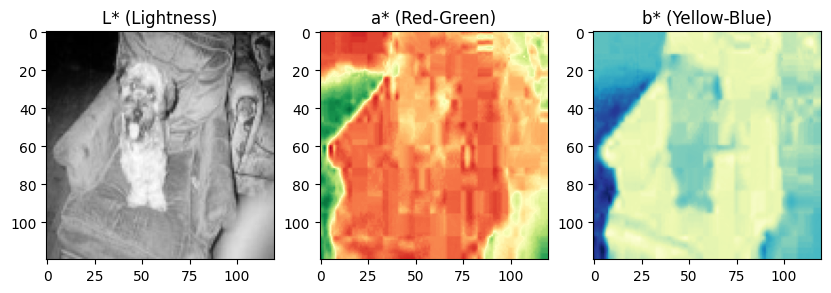

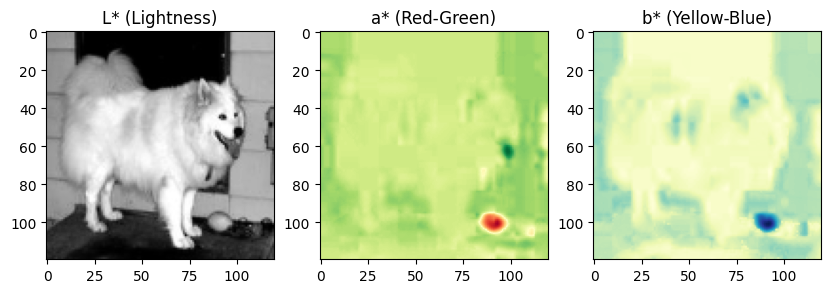

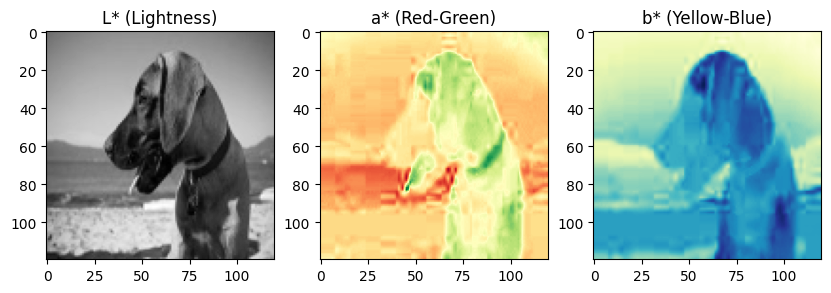

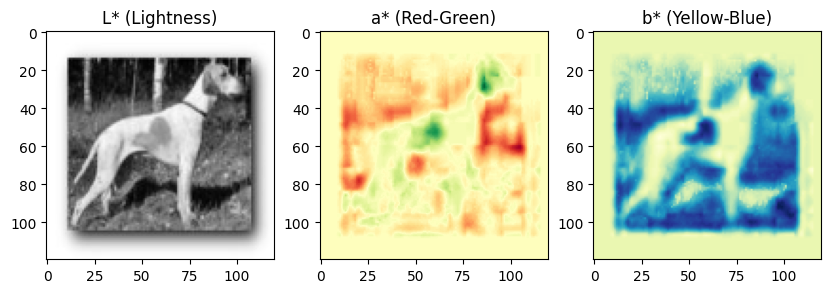

In [40]:
visualize_images_lot_LAB_Channels(test_images_grayscale, test_images_AB_channels, images_to_predict)

### • Finally we compare the original image vs the predicted one in RGB format to see the differences

In [41]:
# Convert LAB to RGB
def lab_to_rgb(lab_img):
    rgb_img = cv2.cvtColor(lab_img, cv2.COLOR_LAB2BGR)
    return rgb_img

In [42]:
def compare_original_vs_predicted(original_test_image, predicted_AB_channels, lot_size = 5, figsize=(10, 10)):
    for i in range(lot_size):
        plt.subplot(1, 2, 1)

        original_test_image_rgb = lab_to_rgb(original_test_image[i])

        plt.imshow(cv2.cvtColor(original_test_image_rgb, cv2.COLOR_BGR2RGB))
        plt.title("Original test image")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        original_test_image[i, :, :, 1:] = predicted_AB_channels[i]  # Replace AB channels in the original LAB image

        predicted_image_rgb = lab_to_rgb(original_test_image[i])
        
        plt.imshow(cv2.cvtColor(predicted_image_rgb, cv2.COLOR_BGR2RGB))
        plt.title("Predicted image")
        plt.axis('off')
        
        plt.show()

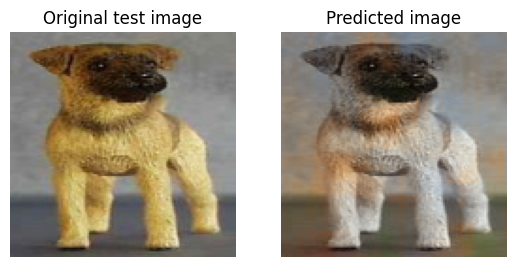

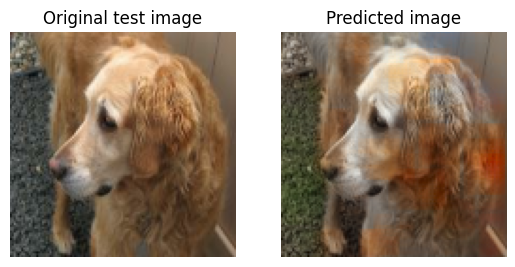

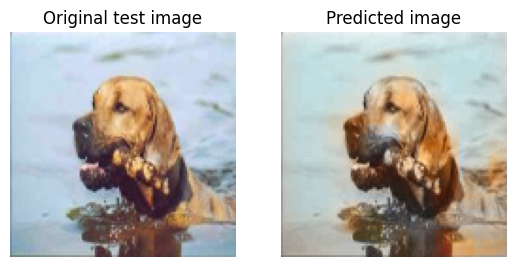

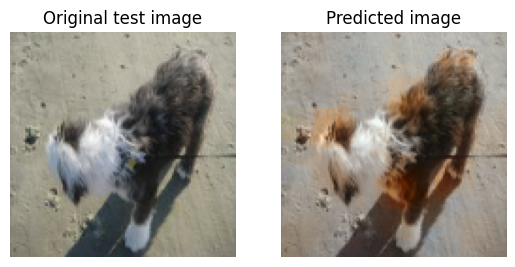

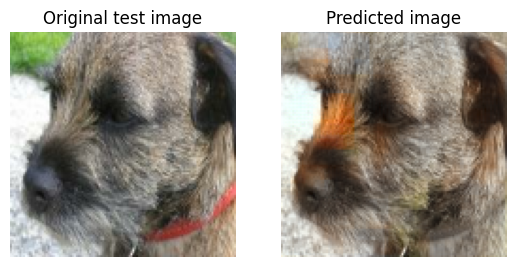

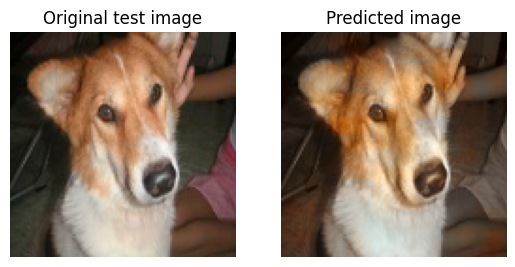

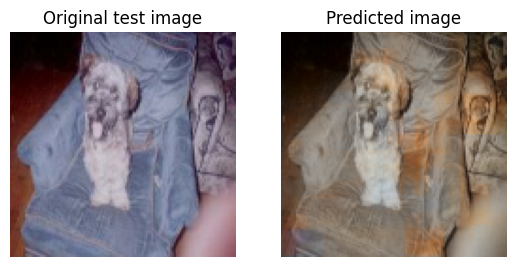

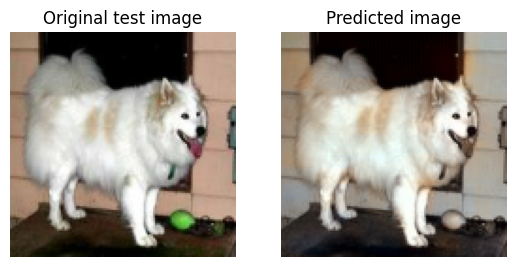

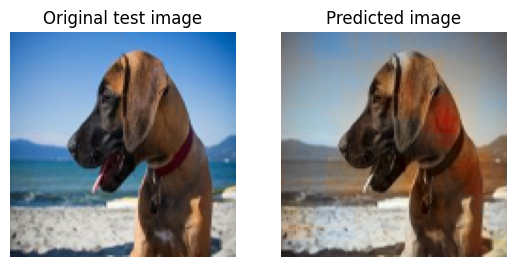

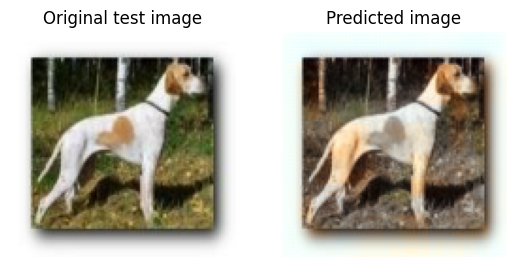

In [43]:
compare_original_vs_predicted(test_dataset_lab_images, first_test_predictions, images_to_predict)